In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# **Q1**

  Coefficient     Value
0          a0  6.826898
1          a1  6.202425
2          a2  3.070697


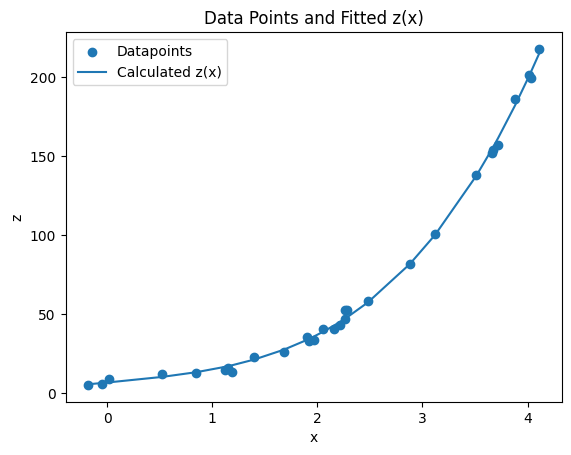

In [2]:
#Part a and b

df_P1 = pd.read_csv(r"C:\Users\nickc\OneDrive\Documents\CMU\Numerical Methods\HW2Problem1.csv", header=None, names=['x', 'z'])
x = df_P1['x']
z = df_P1['z']

df_P1['y1'] = np.sin(x)
df_P1['y2'] = x**3
y1 = df_P1['y1']
y2 = df_P1['y2']

A = np.vstack([np.ones(len(x)), y1, y2]).T
a_values = np.linalg.lstsq(A, z)[0]
#print(a_values)
a0, a1, a2 = a_values

table = pd.DataFrame({'Coefficient': ['a0', 'a1', 'a2'], 'Value': [a0, a1, a2]})
print(table)

z_calc = a0 + a1 * y1 + a2 * y2
df_P1['z(x)'] = z_calc
#need to smooth plot
sorted_indices = np.argsort(x)
x_sorted = x[sorted_indices]
z_calc_sorted = z_calc[sorted_indices]

plt.scatter(x, z, label = 'Datapoints')
plt.plot(x_sorted, z_calc_sorted, label = 'Calculated z(x)')
plt.xlabel('x')
plt.ylabel('z')
plt.title('Data Points and Fitted z(x)')
plt.legend()
plt.show()


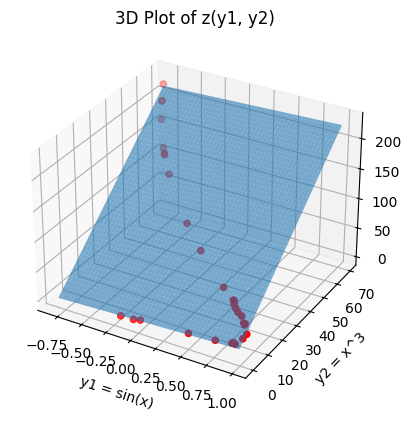

In [3]:
#Part c

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(y1, y2, z, color = 'red', label = 'Datapoints')

y1_min = min(y1)
y1_max = max(y1)
y2_min = min(y2)
y2_max = max(y2)

y1_linspace = np.linspace(y1_min, y1_max, 100)
y2_linspace = np.linspace(y2_min, y2_max, 100)

Y1, Y2 = np.meshgrid(y1_linspace, y2_linspace)
Z = a0 + a1 * Y1 + a2 * Y2

ax.plot_surface(Y1, Y2, Z, alpha = 0.6, label = 'Fitted surface')
ax.set_xlabel('y1 = sin(x)')
ax.set_ylabel('y2 = x^3')
ax.set_zlabel('z')
plt.title('3D Plot of z(y1, y2)')
plt.show()



In [4]:
#Part d
max_error = np.max(np.abs(z - z_calc))
avg_error = np.mean(np.abs(z - z_calc))
RMS_error = np.sqrt(np.mean((z - z_calc) ** 2))

table = pd.DataFrame({'Error Type': ['max', 'Average', 'RMS'], 'Error Value': [max_error, avg_error, RMS_error]})
print(table)

  Error Type  Error Value
0        max     5.940766
1    Average     2.030763
2        RMS     2.495165


# **Q2**


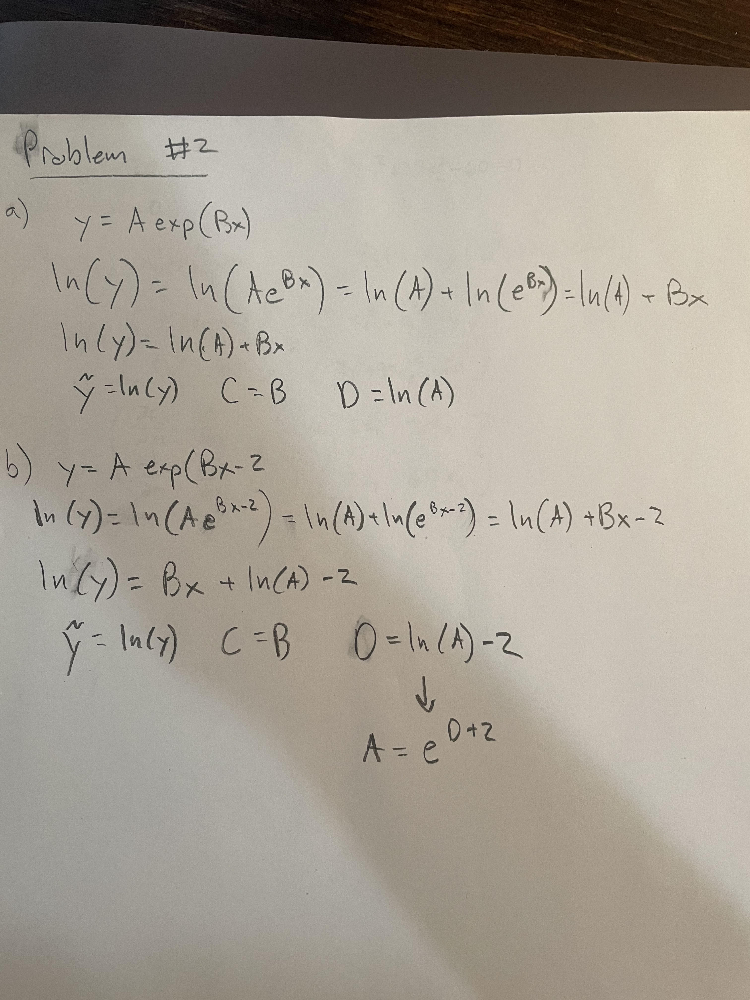

In [25]:
#Part a on picture
#Part b derivation

df_P2 = pd.read_csv(r"C:\Users\nickc\OneDrive\Documents\CMU\Numerical Methods\HW2Problem2.csv", header=None, names=['x', 'y'])
x = df_P2['x']
y = df_P2['y']

#Professor said take absolute value to avoid negatives since we are taking the log
y = np.abs(y)

y_log = np.log(y)
#print(y_log)
A = np.vstack([np.ones(len(x)), x]).T
values = np.linalg.lstsq(A, y_log)[0]
D, C = values
B = C
A = np.exp(D+2)

table = pd.DataFrame({'Parameter': ['A', 'B'], 'Value': [A, B]})
print(table)

  Parameter     Value
0         A  3.235954
1         B  1.798669
